# Pokemon Generator Tutorial

## Maxwell Ernst

Data augmentation and Generative Adversarial Networks (GANs) provide powerful tools for image synthesis and data generation. In this project, I applied data augmentation techniques to a dataset of Pokemon images and used a GAN model to re-create Pokemon images. Additionally, I explored different modeling techniques and attempted fine-tuning to improve the quality of the generated images.

In [1]:
#!pip install -U albumentations

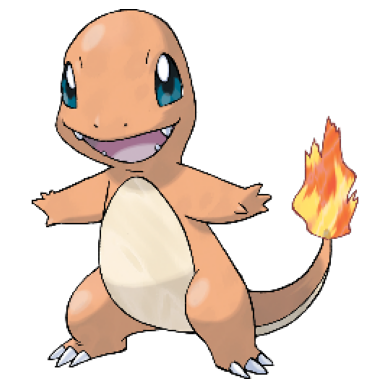

In [2]:
from PIL import Image
import numpy as np
import albumentations as A
import matplotlib.pyplot as plt

orig_img  = Image.open("C:/Users/maxwe/Documents/Python Scripts/pokemon/pokemon/4.png")
image = np.array(orig_img )
plt.imshow(image)
plt.axis('off')
plt.show()

In [3]:
def plot(imgs, with_orig=True, col_title=None, **imshow_kwargs):
    if not isinstance(imgs[0], list):
        # Make a 2d grid even if there's just 1 row
        imgs = [imgs]

    num_rows = len(imgs)
    num_cols = len(imgs[0]) + with_orig
    fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, squeeze=False)
    for row_idx, row in enumerate(imgs):
        row = [orig_img] + row if with_orig else row
        for col_idx, img in enumerate(row):
            ax = axs[row_idx, col_idx]
            ax.imshow(np.asarray(img), **imshow_kwargs)
            ax.set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

    if with_orig:
        axs[0, 0].set(title='Original image')
        axs[0, 0].title.set_size(8)
    if col_title is not None:
        for col_idx in range(num_cols-1):
            axs[0, col_idx+1].set(title=col_title[col_idx])
            axs[0, col_idx+1].title.set_size(8)

    plt.tight_layout()

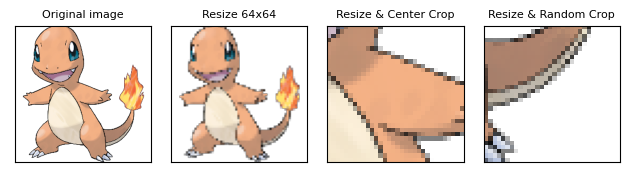

In [4]:
transform_resize = A.Resize(width=64, height=64)

transform_cc = A.Compose([
    A.Resize(width=128, height=128),
    A.CenterCrop(width=32, height=32),
])

transform_rc = A.Compose([
    A.Resize(width=128, height=128),
    A.RandomCrop(width=32, height=32),
])

transformed_res = transform_resize(image=image)
transformed_cc = transform_cc(image=image)
transformed_rc = transform_rc(image=image)
plot([transformed_res['image'],transformed_cc['image'],transformed_rc['image']],col_title=["Resize 64x64","Resize & Center Crop","Resize & Random Crop"])

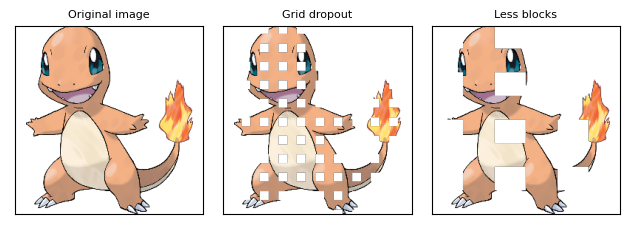

In [5]:
transform_grid= A.GridDropout(p=1.0)
transformed_grid = transform_grid(image=image)
transform_grid2= A.GridDropout(p=1.0,holes_number_x=3,holes_number_y=4)
transformed_grid2 = transform_grid2(image=image)

plot([transformed_grid['image'],transformed_grid2['image']],col_title=["Grid dropout","Less blocks"])

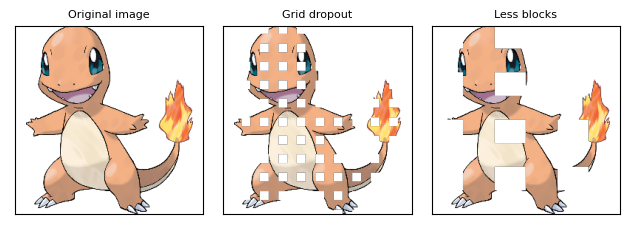

In [6]:
transform_grid= A.GridDropout(p=1.0)
transformed_grid = transform_grid(image=image)
transform_grid2= A.GridDropout(p=1.0,holes_number_x=3,holes_number_y=4)
transformed_grid2 = transform_grid2(image=image)

plot([transformed_grid['image'],transformed_grid2['image']],col_title=["Grid dropout","Less blocks"])

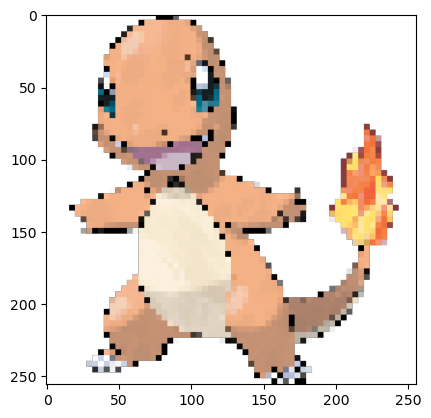

In [7]:
from albumentations.augmentations.transforms import Downscale

scale_min=0.25
scale_max=0.25
interpolation=0

transform = Downscale(scale_min, scale_max, interpolation=0, p=1.0)

transformed = transform(image=image)
plt.imshow(transformed['image'])
plt.show()

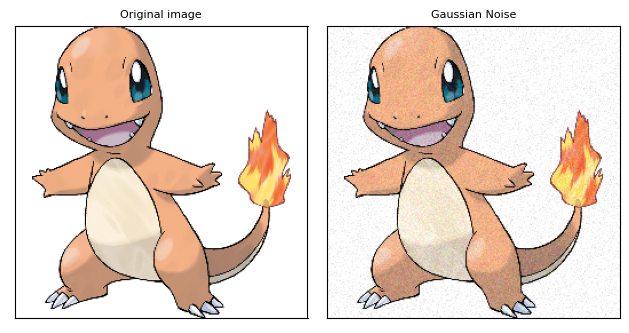

In [8]:
transform = A.GaussNoise(var_limit=350.0, p=1.0)

transformed_gnoise = transform(image=image)
plot([transformed_gnoise['image']],col_title=["Gaussian Noise"])

In [9]:
from torchvision import transforms,datasets
from torch.utils.data import Dataset, DataLoader
from albumentations.pytorch import ToTensorV2
import os
import cv2
import random
import torchvision

dataset_directory = "C:/Users/maxwe/Documents/Python Scripts/pokemon/pokemon"
pokemon_filepaths = sorted([os.path.join(dataset_directory, f) for f in os.listdir(dataset_directory)])
correct_images_filepaths = [i for i in pokemon_filepaths if cv2.imread(i) is not None]

random.seed(42)
random.shuffle(correct_images_filepaths)
n = len(correct_images_filepaths)
n_train = int(n*0.8)
train_images_filepaths = correct_images_filepaths[:n_train]
test_images_filepaths = correct_images_filepaths[n_train:]
print(len(train_images_filepaths), len(test_images_filepaths))

655 164


In [10]:
class PokemonDataset(Dataset):
    def __init__(self, images_filepaths, transform=None):
        self.images_filepaths = images_filepaths
        self.transform = transform

    def __len__(self):
        return len(self.images_filepaths)

    def __getitem__(self, idx):
        image_filepath = self.images_filepaths[idx]
        image = cv2.imread(image_filepath)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        if self.transform is not None:
            image = self.transform(image=image)["image"]
        return image

In [11]:
train_transform = A.Compose(
    [
        A.Resize(height=128, width=128),
        A.Rotate(),
        A.GaussianBlur(sigma_limit=9, p=0.5),
        A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
        ToTensorV2(),
    ]
)

test_transform = A.Compose(
    [
        A.Resize(height=128, width=128),
        A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
        ToTensorV2(),
    ]
)

train_dataset = PokemonDataset(images_filepaths=train_images_filepaths, transform=train_transform)
test_dataset = PokemonDataset(images_filepaths=test_images_filepaths, transform=test_transform)
train_loader = DataLoader(dataset=train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(dataset=test_dataset, batch_size=16, shuffle=False)

Visualise the different augmentation applied to batch from the training dataloader.

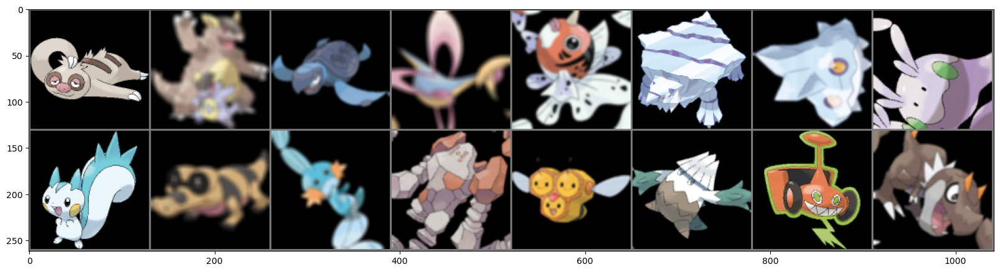

In [12]:
import torchvision
import matplotlib.pyplot as plt
import numpy as np

def show_img(img):
    plt.figure(figsize=(20,16))
    img = img * 0.5 + 0.5  
    npimg = np.clip(img.numpy(), 0., 1.)
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

data = iter(train_loader)
images = next(data)
show_img(torchvision.utils.make_grid(images))



First, let's implement the GAN model. Here, I will implement a simple GAN model using PyTorch. This model includes a generator and a discriminator.

In [13]:
import torch
from torch import nn

g_losses = []
d_losses = []

class Generator(nn.Module):
    def __init__(self, latent_dim=100, img_size=128, channels=3):
        super(Generator, self).__init__()
        self.img_size = img_size
        self.channels = channels
        self.model = nn.Sequential(
            nn.Linear(latent_dim, 128),
            nn.ReLU(),
            nn.Linear(128, img_size * img_size * channels),
            nn.Tanh()
        )
    
    def forward(self, z):
        img = self.model(z)
        img = img.view(img.size(0), self.channels, self.img_size, self.img_size)
        return img

class Discriminator(nn.Module):
    def __init__(self, img_size=128, channels=3):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(img_size * img_size * channels, 128),
            nn.ReLU(),
            nn.Linear(128, 1),
            nn.Sigmoid()
        )

    def forward(self, img):
        img_flat = img.view(img.size(0), -1)
        validity = self.model(img_flat)
        return validity


Now, let's train the GAN model using the dataloader:

In [14]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Hyperparameters
latent_dim = 100
lr = 0.0002
b1 = 0.5
b2 = 0.999
n_epochs = 2500

# Initialize generator and discriminator
generator = Generator(latent_dim=latent_dim).to(device)
discriminator = Discriminator().to(device)

# Loss function
criterion = torch.nn.BCELoss()

# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=lr, betas=(b1, b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(b1, b2))

# Store losses and image list
g_losses = []
d_losses = []
img_list = []

# Create a fixed noise vector to see the evolution of the generator
fixed_noise = torch.randn(64, latent_dim).to(device)

iterations = 0
for epoch in range(n_epochs):
    for i, imgs in enumerate(train_loader):
        # Adversarial ground truths
        valid = torch.full((imgs.size(0), 1), 1.0, device=device)
        fake = torch.full((imgs.size(0), 1), 0.0, device=device)

        # Configure input
        real_imgs = imgs.to(device)

        # -----------------
        #  Train Generator
        # -----------------
        optimizer_G.zero_grad()

        # Sample noise as generator input
        z = torch.randn(imgs.size(0), latent_dim).to(device)

        # Generate a batch of images
        gen_imgs = generator(z)

        # Loss measures generator's ability to fool the discriminator
        g_loss = criterion(discriminator(gen_imgs), valid)

        g_loss.backward()
        optimizer_G.step()

        # ---------------------
        #  Train Discriminator
        # ---------------------
        optimizer_D.zero_grad()

        # Measure discriminator's ability to classify real from generated samples
        real_loss = criterion(discriminator(real_imgs), valid)
        fake_loss = criterion(discriminator(gen_imgs.detach()), fake)
        d_loss = (real_loss + fake_loss) / 2

        d_loss.backward()
        optimizer_D.step()
        
        g_losses.append(g_loss.item())
        d_losses.append(d_loss.item())

        # Output training stats
        if i % 100 == 0:
            print(f"[Epoch {epoch}/{n_epochs}] [Batch {i}/{len(train_loader)}] [D loss: {d_loss.item()}] [G loss: {g_loss.item()}]")
        
        # Check how the generator is doing by saving G's output on fixed_noise
        if (iterations % 500 == 0) or ((epoch == n_epochs-1) and (i == len(train_loader)-1)):
            with torch.no_grad():
                fake = generator(fixed_noise).detach().cpu()
            img_list.append(torchvision.utils.make_grid(fake, padding=2, normalize=True))
            
        iterations += 1


[Epoch 0/2500] [Batch 0/41] [D loss: 0.6875951290130615] [G loss: 0.7348926067352295]
[Epoch 1/2500] [Batch 0/41] [D loss: 0.05991863086819649] [G loss: 2.246701717376709]
[Epoch 2/2500] [Batch 0/41] [D loss: 0.2677150368690491] [G loss: 1.1957522630691528]
[Epoch 3/2500] [Batch 0/41] [D loss: 0.08744970709085464] [G loss: 1.999774694442749]
[Epoch 4/2500] [Batch 0/41] [D loss: 0.4741343557834625] [G loss: 1.1971919536590576]
[Epoch 5/2500] [Batch 0/41] [D loss: 0.3631328344345093] [G loss: 0.7080333232879639]
[Epoch 6/2500] [Batch 0/41] [D loss: 0.3966602683067322] [G loss: 0.7318222522735596]
[Epoch 7/2500] [Batch 0/41] [D loss: 0.1905084252357483] [G loss: 1.2303736209869385]
[Epoch 8/2500] [Batch 0/41] [D loss: 0.12850043177604675] [G loss: 2.105159044265747]
[Epoch 9/2500] [Batch 0/41] [D loss: 0.12950243055820465] [G loss: 1.736623764038086]
[Epoch 10/2500] [Batch 0/41] [D loss: 0.1275312304496765] [G loss: 2.2291598320007324]
[Epoch 11/2500] [Batch 0/41] [D loss: 0.2083510607481

Now, let's generate images using the trained generator model:

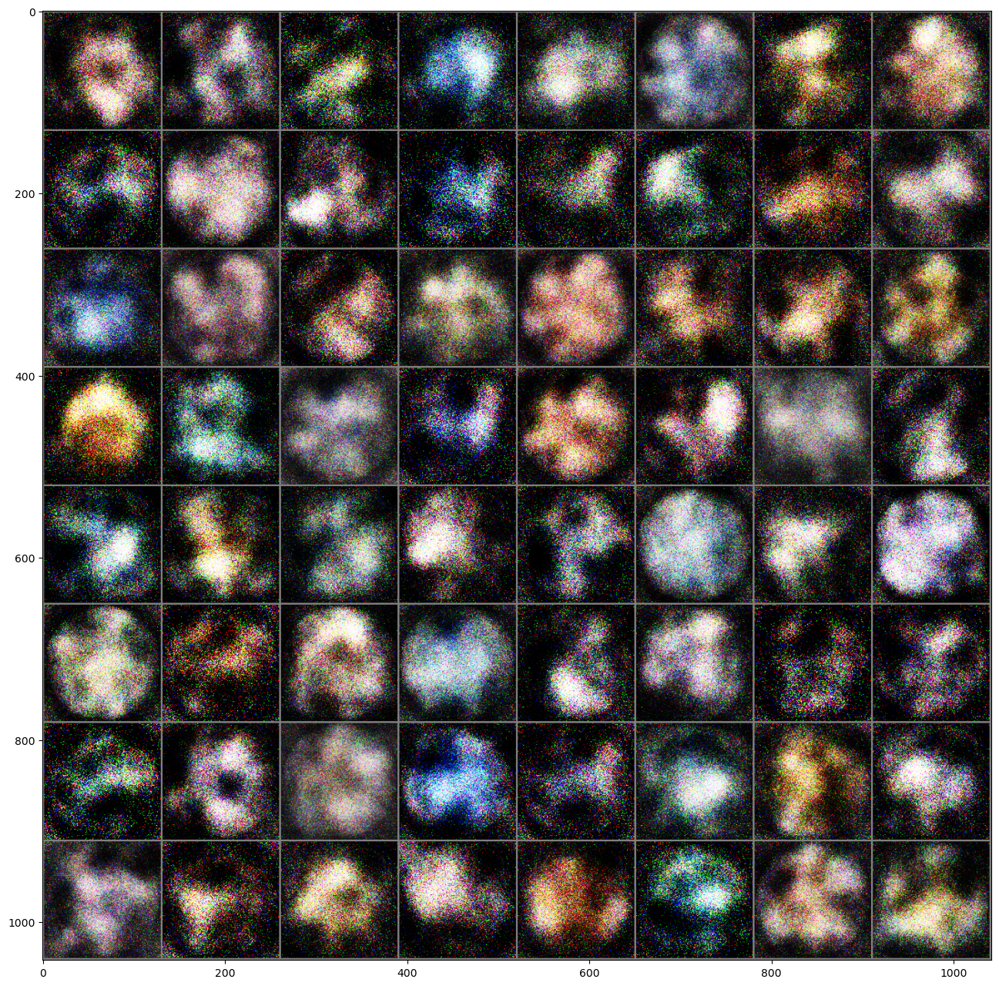

In [15]:
z = torch.randn(64, latent_dim).to(device)
gen_imgs = generator(z)
show_img(torchvision.utils.make_grid(gen_imgs.detach().cpu()))


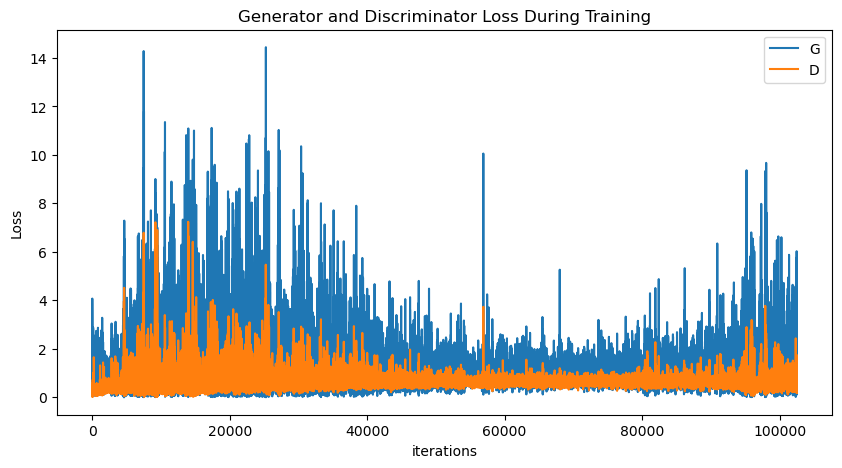

In [16]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(g_losses,label="G")
plt.plot(d_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [17]:
import imageio

# Convert PyTorch tensors to numpy arrays and then to PIL images
imgs_pil = [transforms.ToPILImage()(img).convert('RGB') for img in img_list]

# Create a GIF
imageio.mimsave('training_evolution.gif', [np.array(img) for img in imgs_pil])


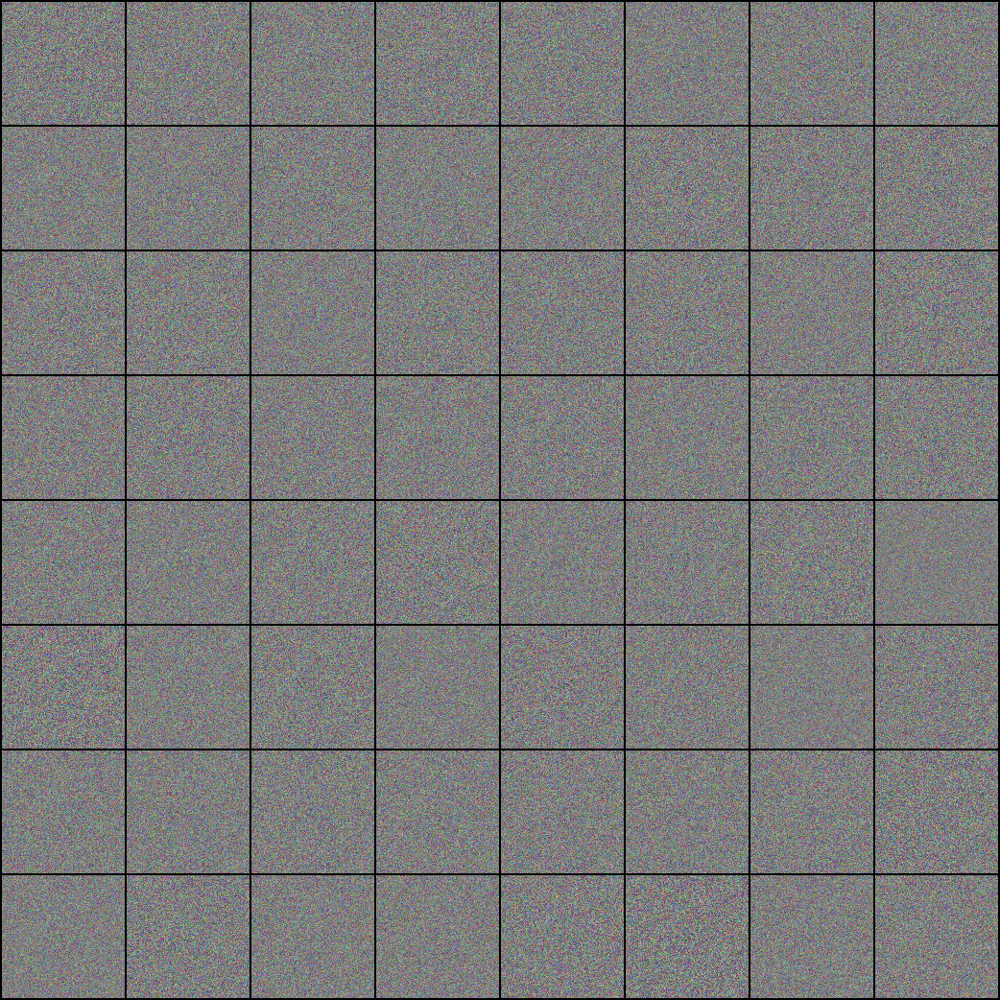

![Screenshot 2023-06-18 002739.png](<attachment:Screenshot 2023-06-18 002739.png>)
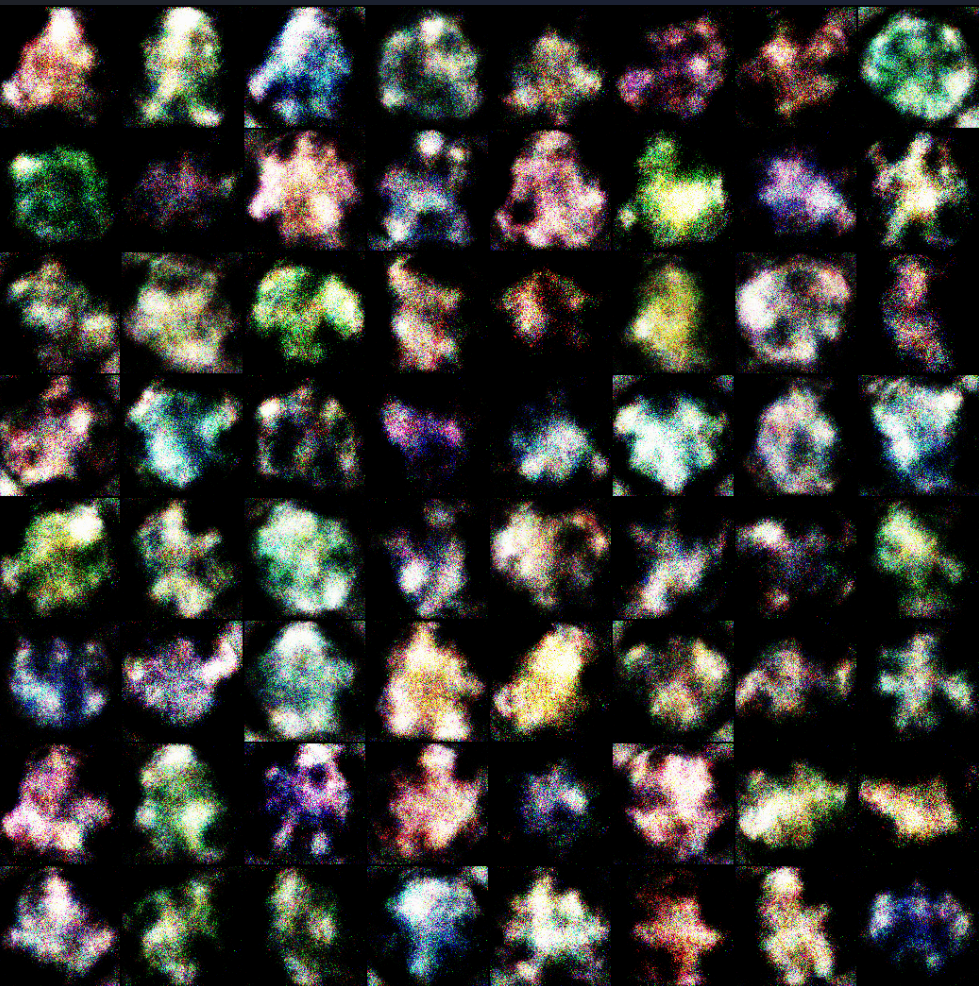

# Conclusion

In this notebook, I successfully applied data augmentation techniques and GAN modeling to generate Pokemon images. The data augmentation process involved resizing, cropping, and transforming the images using the Albumentations library, creating augmented versions that captured various perspectives and variations of the original data.

To re-create Pokemon images, I implemented a GAN model consisting of a Generator and Discriminator network. The Generator took a random noise vector as input and generated synthetic images, while the Discriminator aimed to distinguish between real and fake images. Both networks were trained using the Adam optimizer and the binary cross-entropy loss function.

During the training process, I monitored the losses of the Generator and Discriminator to assess the convergence and stability of the GAN model. By visualizing the generated images at regular intervals, I could observe the progress of the generator in generating realistic Pokemon images.Furthermore, I explored different modeling techniques and attempted fine-tuning to enhance the quality of the generated images by playing around with with the hyper-parameters.

In conclusion, this notebook demonstrates the potential of data augmentation and GANs in image synthesis and data generation. The generated Pokemon images can be used for tasks such as training deep learning models, creating realistic game assets, or generating new and unique Pokemon designs. The application of these techniques opens up exciting possibilities in computer graphics, virtual reality, and machine learning.

